# ReCell - Problem Statement

## Context
Buying and selling used smartphones used to be something that happened on a handful of online marketplace sites. But the used and refurbished phone market has grown considerably over the past decade, and a new IDC (International Data Corporation) forecast predicts that the used phone market would be worth $52.7bn by 2023 with a compound annual growth rate (CAGR) of 13.6% from 2018 to 2023. This growth can be attributed to an uptick in demand for used smartphones that offer considerable savings compared with new models.
Refurbished and used devices continue to provide cost-effective alternatives to both consumers and businesses that are looking to save money when purchasing a smartphone. There are plenty of other benefits associated with the used smartphone market. Used and refurbished devices can be sold with warranties and can also be insured with proof of purchase. Third-party vendors/platforms, such as Verizon, Amazon, etc., provide attractive offers to customers for refurbished smartphones. Maximizing the longevity of mobile phones through second-hand trade also reduces their environmental impact and helps in recycling and reducing waste. The impact of the COVID-19 outbreak may further boost the cheaper refurbished smartphone segment, as consumers cut back on discretionary spending and buy phones only for immediate needs.
 
## Objective
The rising potential of this comparatively under-the-radar market fuels the need for an ML-based solution to develop a dynamic pricing strategy for used and refurbished smartphones. ReCell, a startup aiming to tap the potential in this market, has hired you as a data scientist. They want you to analyze the data provided and build a linear regression model to predict the price of a used phone and identify factors that significantly influence it.


## Importing necessary libraries and data

In [173]:
import numpy as np
from sklearn.linear_model import LinearRegression
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
import pandas_profiling

%matplotlib inline
import seaborn as sns
from sklearn.model_selection import (
    train_test_split,
)  # Sklearn package's randomized data splitting function
import pandas_profiling

sns.set(color_codes=True)
import warnings

from sklearn.model_selection import (
    train_test_split,
)  # Sklearn package's randomized data splitting function

# to split the data into train and test
from sklearn.model_selection import train_test_split

# to build linear regression_model
from sklearn.linear_model import LinearRegression

# to check model performance
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# to build linear regression_model using statsmodels
import statsmodels.api as sm


warnings.filterwarnings("ignore")
%load_ext nb_black
import scipy.stats as stats

# This is so I can see the entire dataframe when I print it
pd.set_option("display.max_columns", None)
# pd.set_option('display.max_rows', None)
pd.set_option("display.max_rows", 200)

The nb_black extension is already loaded. To reload it, use:
  %reload_ext nb_black


<IPython.core.display.Javascript object>

**Questions**:

1. What does the distribution of used phone prices look like?
2. What percentage of the used phone market is dominated by Android devices?
3. The amount of RAM is important for the smooth functioning of a phone. How does the amount of RAM vary with the brand?
4. A large battery often increases a phone's weight, making it feel uncomfortable in the hands. How does the weight vary for phones offering large batteries (more than 4500 mAh)?
5. Bigger screens are desirable for entertainment purposes as they offer a better viewing experience. How many phones are available across different brands with a screen size larger than 6 inches?
6. Budget phones nowadays offer great selfie cameras, allowing us to capture our favorite moments with loved ones. What is the distribution of budget phones offering greater than 8MP selfie cameras across brands?
7. Which attributes are highly correlated with the used phone price?

# 2. Loading and exploring the data

In this section the goals are to load the data into python and then to check its basic properties. This will include the dimension, column types and names, and missingness counts.

## Data Overview

- Observations
- Sanity checks

In [174]:
df = pd.read_csv(r"C:\Users\majan\Downloads\used_phone_data.csv")
print(f"There are {df.shape[0]} rows and {df.shape[1]} columns.")  # f-string

# I'm now going to look at 10 random rows
# I'm setting the random seed via np.random.seed so that
# I get the same random results every time
np.random.seed(1)
df.sample(n=10)

There are 3571 rows and 15 columns.


,brand_name,os,screen_size,4g,5g,main_camera_mp,selfie_camera_mp,int_memory,ram,battery,weight,release_year,days_used,new_price,used_price
2501,Samsung,Android,13.49,yes,no,13.0,13.0,32.0,4.00,3600.0,181.0,2017,683,198.680,79.47
2782,Sony,Android,13.81,yes,no,NaN,8.0,32.0,4.00,3300.0,156.0,2019,195,198.150,149.10
605,Others,Android,12.70,yes,no,8.0,5.0,16.0,4.00,2400.0,137.0,2015,1048,161.470,48.39
2923,Vivo,Android,19.37,yes,no,13.0,16.0,64.0,4.00,3260.0,149.3,2019,375,211.880,138.31
941,Others,Others,5.72,no,no,0.3,0.3,32.0,0.25,820.0,90.0,2013,883,29.810,8.92
1833,LG,Android,13.49,no,no,8.0,1.3,32.0,4.00,3140.0,161.0,2013,670,240.540,96.18
671,Apple,iOS,14.92,yes,no,12.0,7.0,64.0,4.00,5493.0,48.0,2018,403,700.150,350.08
1796,LG,Android,17.78,yes,no,5.0,0.3,16.0,4.00,4000.0,294.8,2014,708,189.300,75.94
757,Asus,Android,13.49,yes,no,13.0,8.0,32.0,4.00,5000.0,181.0,2017,612,270.500,108.13
3528,Realme,Android,15.72,yes,no,NaN,16.0,64.0,4.00,4035.0,184.0,2019,433,159.885,80.00


<IPython.core.display.Javascript object>

## Data Preprocessing

- Missing value treatment
- Feature engineering (if needed)
- Outlier detection and treatment (if needed)
- Preparing data for modeling
- Any other preprocessing steps (if needed)

In [175]:
# let's create a copy of the data to avoid any changes to original data
df1 = df.copy()
df1.head()

,brand_name,os,screen_size,4g,5g,main_camera_mp,selfie_camera_mp,int_memory,ram,battery,weight,release_year,days_used,new_price,used_price
0,Honor,Android,23.97,yes,no,13.0,5.0,64.0,3.0,3020.0,146.0,2020,127,111.62,86.96
1,Honor,Android,28.10,yes,yes,13.0,16.0,128.0,8.0,4300.0,213.0,2020,325,249.39,161.49
2,Honor,Android,24.29,yes,yes,13.0,8.0,128.0,8.0,4200.0,213.0,2020,162,359.47,268.55
3,Honor,Android,26.04,yes,yes,13.0,8.0,64.0,6.0,7250.0,480.0,2020,345,278.93,180.23
4,Honor,Android,15.72,yes,no,13.0,8.0,64.0,3.0,5000.0,185.0,2020,293,140.87,103.80


<IPython.core.display.Javascript object>

In [4]:
pandas_profiling.ProfileReport(df1)

Summarize dataset:   0%|          | 0/28 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>

In [176]:
# checking for Duplicates
df.duplicated(keep=False).sum()

0

<IPython.core.display.Javascript object>

In [177]:
df.info()  # checking information

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3571 entries, 0 to 3570
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   brand_name        3571 non-null   object 
 1   os                3571 non-null   object 
 2   screen_size       3571 non-null   float64
 3   4g                3571 non-null   object 
 4   5g                3571 non-null   object 
 5   main_camera_mp    3391 non-null   float64
 6   selfie_camera_mp  3569 non-null   float64
 7   int_memory        3561 non-null   float64
 8   ram               3561 non-null   float64
 9   battery           3565 non-null   float64
 10  weight            3564 non-null   float64
 11  release_year      3571 non-null   int64  
 12  days_used         3571 non-null   int64  
 13  new_price         3571 non-null   float64
 14  used_price        3571 non-null   float64
dtypes: float64(9), int64(2), object(4)
memory usage: 418.6+ KB


<IPython.core.display.Javascript object>

* brand_name,os,4g and5g are of object type
* release_year and days_used are of int64 type
* the rest of the variables are of float64

In [178]:
# looking at which columns have the most missing values
df.isnull().sum().sort_values(ascending=False)

main_camera_mp      180
int_memory           10
ram                  10
weight                7
battery               6
selfie_camera_mp      2
brand_name            0
os                    0
screen_size           0
4g                    0
5g                    0
release_year          0
days_used             0
new_price             0
used_price            0
dtype: int64

<IPython.core.display.Javascript object>

* Main_Camera,int_memory,ram,weight,battery,selfie_camera_mp have missing calues and the rest of the variables do not have missing values

In [179]:
# counting the number of missing values per row
df.isnull().sum(axis=1).value_counts()

0    3368
1     193
2       8
3       2
dtype: int64

<IPython.core.display.Javascript object>

In [180]:
# most rows don't have missing values now
num_missing = df.isnull().sum(axis=1)
num_missing.value_counts()

0    3368
1     193
2       8
3       2
dtype: int64

<IPython.core.display.Javascript object>

In [181]:
# Let's look at the statistical summary of the data
df1.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
brand_name,3571,34,Others,509,NaN,NaN,NaN,NaN,NaN,NaN,NaN
os,3571,4,Android,3246,NaN,NaN,NaN,NaN,NaN,NaN,NaN
screen_size,3571.0,NaN,NaN,NaN,14.803892,5.153092,2.7,12.7,13.49,16.51,46.36
4g,3571,2,yes,2359,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5g,3571,2,no,3419,NaN,NaN,NaN,NaN,NaN,NaN,NaN
main_camera_mp,3391.0,NaN,NaN,NaN,9.400454,4.818396,0.08,5.0,8.0,13.0,48.0
selfie_camera_mp,3569.0,NaN,NaN,NaN,6.547352,6.879359,0.3,2.0,5.0,8.0,32.0
int_memory,3561.0,NaN,NaN,NaN,54.532607,84.696246,0.005,16.0,32.0,64.0,1024.0
ram,3561.0,NaN,NaN,NaN,4.056962,1.391844,0.03,4.0,4.0,4.0,16.0
battery,3565.0,NaN,NaN,NaN,3067.225666,1364.206665,80.0,2100.0,3000.0,4000.0,12000.0


<IPython.core.display.Javascript object>

* There are 4 types of OS on which the phone runs
* There are 2 4g and two 5g networks
*There is a huge difference between the 3rd quartile and the maximum values of used_price,new_price,days_used. This could indicate possibilities of outliers that needs to be dealt with

### 1. What does the distribution of used phone prices look like?

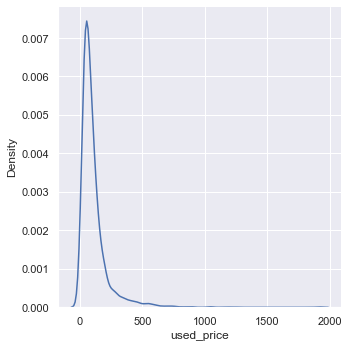

<IPython.core.display.Javascript object>

In [182]:
sns.displot(df1["used_price"], kind="kde")

In [183]:
# function to plot a boxplot and a histogram along the same scale.


def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to show the density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="white"
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

<IPython.core.display.Javascript object>

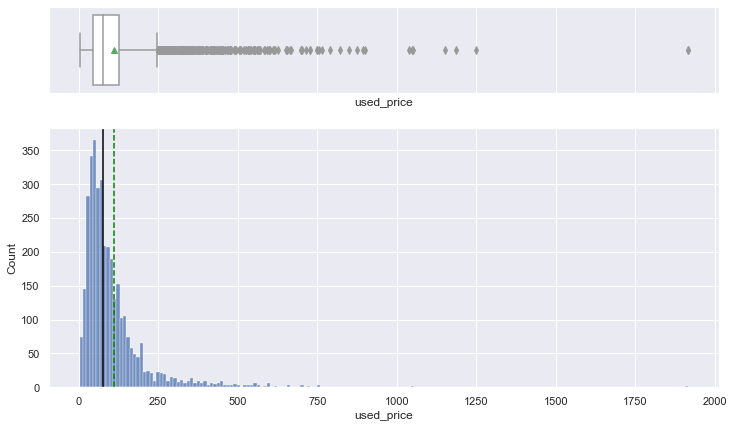

<IPython.core.display.Javascript object>

In [184]:
histogram_boxplot(df1, "used_price")

* The distribution of Used Price is right skewed.
* There are a outliers in this variable
* The mean for the used_price of phones is 109.880277 

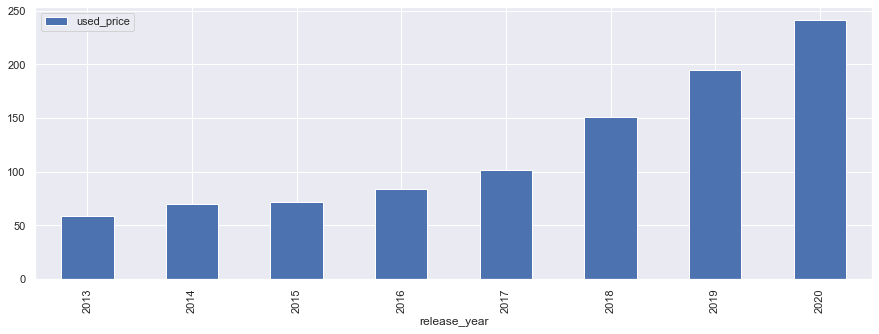

<IPython.core.display.Javascript object>

In [185]:
df1.groupby(by=["release_year"])["used_price"].mean().reset_index().sort_values(
    ["used_price"]
).plot(x="release_year", y="used_price", kind="bar", figsize=(15, 5))
plt.show()

* 2013 year had the lowed price for the refurbished phones.
* 2020 had the highest price for the refurbished phones.

### 2.  What percentage of the used phone market is dominated by Android devices?

In [186]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

<IPython.core.display.Javascript object>

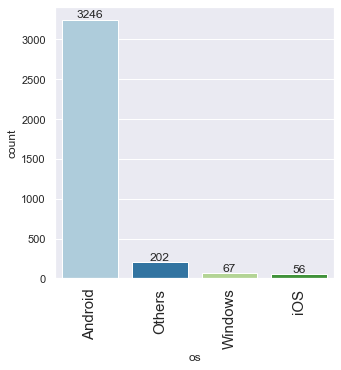

<IPython.core.display.Javascript object>

In [187]:
labeled_barplot(df1, "os")

In [188]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

<IPython.core.display.Javascript object>

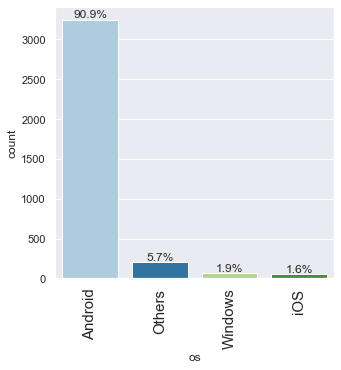

<IPython.core.display.Javascript object>

In [189]:
labeled_barplot(df, "os", perc=True)

Observations
* 90.9% of the os used_phones use Android.

### 3. The amount of RAM is important for the smooth functioning of a phone. How does the amount of RAM vary with the brand?

In [190]:
# pring the number of missing values in ram
print(df["ram"].isnull().sum())

10


<IPython.core.display.Javascript object>

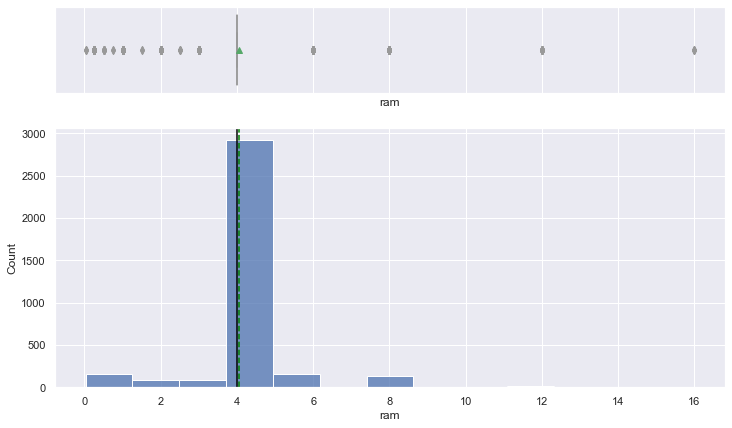

<IPython.core.display.Javascript object>

In [191]:
histogram_boxplot(df1, "ram")

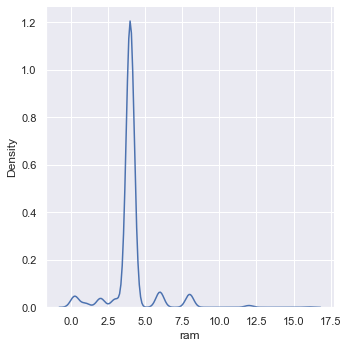

<IPython.core.display.Javascript object>

In [192]:
sns.displot(df1["ram"], kind="kde")

*For an unskewed numerical variable, the mean of the variable can be used to impute missing values.

In [193]:
# instead of dropping the rows, lets replace the missing values with mean value.
df1.mean()

screen_size           14.803892
main_camera_mp         9.400454
selfie_camera_mp       6.547352
int_memory            54.532607
ram                    4.056962
battery             3067.225666
weight               179.424285
release_year        2015.964996
days_used            675.391487
new_price            237.389037
used_price           109.880277
dtype: float64

<IPython.core.display.Javascript object>

In [194]:
df1["ram"].fillna(df1["ram"].mean(), inplace=True)  # mean imputation
df1["ram"].isnull().sum()

0

<IPython.core.display.Javascript object>

In [195]:
df1.isnull().sum()

brand_name            0
os                    0
screen_size           0
4g                    0
5g                    0
main_camera_mp      180
selfie_camera_mp      2
int_memory           10
ram                   0
battery               6
weight                7
release_year          0
days_used             0
new_price             0
used_price            0
dtype: int64

<IPython.core.display.Javascript object>

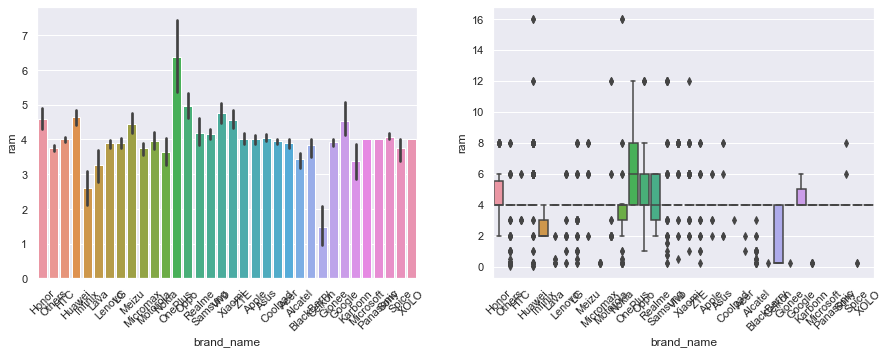

<IPython.core.display.Javascript object>

In [196]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)
sns.barplot(data=df1, y="ram", x="brand_name")
plt.xticks(rotation=45)

plt.subplot(1, 2, 2)
sns.boxplot(data=df1, y="ram", x="brand_name")
plt.xticks(rotation=45)

plt.show()

In [197]:
df.groupby("brand_name")["ram"].mean()

brand_name
Acer          3.901961
Alcatel       3.426000
Apple         4.000000
Asus          4.047619
BlackBerry    3.829545
Celkon        1.466216
Coolpad       3.954545
Gionee        3.933036
Google        4.533333
HTC           4.000000
Honor         4.593220
Huawei        4.641326
Infinix       2.600000
Karbonn       3.375000
LG            3.893868
Lava          3.277778
Lenovo        3.886628
Meizu         4.451613
Micromax      3.750000
Microsoft     4.000000
Motorola      3.945455
Nokia         3.601351
OnePlus       6.363636
Oppo          4.961240
Others        3.751041
Panasonic     4.000000
Realme        4.195122
Samsung       4.159341
Sony          4.068182
Spice         3.750000
Vivo          4.756410
XOLO          4.000000
Xiaomi        4.567164
ZTE           4.023050
Name: ram, dtype: float64

<IPython.core.display.Javascript object>

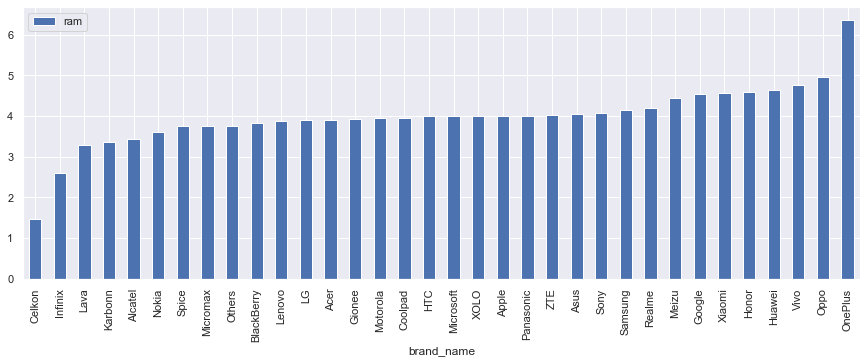

<IPython.core.display.Javascript object>

In [198]:
df.groupby(by=["brand_name"])["ram"].mean().reset_index().sort_values(["ram"]).plot(
    x="brand_name", y="ram", kind="bar", figsize=(15, 5)
)
plt.show()

* Celkon brand has the lowest ram
* OnePlus brand has the highest ram on used phones

### 4. A large battery often increases a phone's weight, making it feel uncomfortable in the hands. How does the weight vary for phones offering large batteries (more than 4500 mAh)?

In [199]:
# pring the number of missing values in weight
print(df1["weight"].isnull().sum())

7


<IPython.core.display.Javascript object>

In [200]:
# pring the number of missing values in battery
print(df1["battery"].isnull().sum())

6


<IPython.core.display.Javascript object>

* Weight and battery have got 7 and 6 missing values respectively

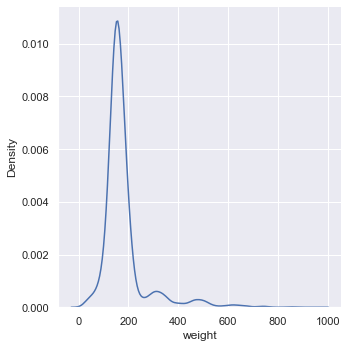

<IPython.core.display.Javascript object>

In [201]:
sns.displot(df1["weight"], kind="kde")

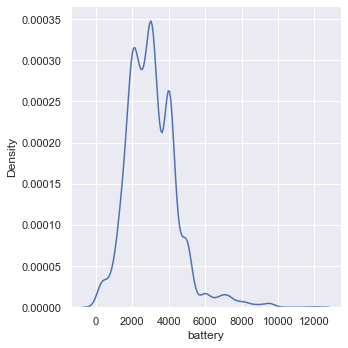

<IPython.core.display.Javascript object>

In [202]:
sns.displot(df1["battery"], kind="kde")

In [203]:
df1[["weight", "battery"]].median()

weight      159.0
battery    3000.0
dtype: float64

<IPython.core.display.Javascript object>

In [204]:
# df['Passing'].isnull().sum())
df1.isnull().sum()

brand_name            0
os                    0
screen_size           0
4g                    0
5g                    0
main_camera_mp      180
selfie_camera_mp      2
int_memory           10
ram                   0
battery               6
weight                7
release_year          0
days_used             0
new_price             0
used_price            0
dtype: int64

<IPython.core.display.Javascript object>

In [205]:
# now using `fillna` with a numeric column
print(df1["weight"].isnull().sum())
df1["weight"].fillna(df["weight"].median(), inplace=True)  # median imputation
df1["weight"].isnull().sum()

7


0

<IPython.core.display.Javascript object>

In [206]:
# now using `fillna` with a numeric column
print(df1["battery"].isnull().sum())
df1["battery"].fillna(df["battery"].median(), inplace=True)  # median imputation
df1["battery"].isnull().sum()

6


0

<IPython.core.display.Javascript object>

In [207]:
print(df1.isnull().sum())

brand_name            0
os                    0
screen_size           0
4g                    0
5g                    0
main_camera_mp      180
selfie_camera_mp      2
int_memory           10
ram                   0
battery               0
weight                0
release_year          0
days_used             0
new_price             0
used_price            0
dtype: int64


<IPython.core.display.Javascript object>

In [208]:
# large batteries (more than 4500 mAh)

<IPython.core.display.Javascript object>

In [209]:
df1["battery"].describe()

count     3571.000000
mean      3067.112714
std       1363.062572
min         80.000000
25%       2100.000000
50%       3000.000000
75%       4000.000000
max      12000.000000
Name: battery, dtype: float64

<IPython.core.display.Javascript object>

In [210]:
df_highres = df[df.battery > 4500]
df_highres.weight.value_counts()

195.0    11
199.0     9
185.0     9
208.0     7
460.0     7
310.0     7
498.0     6
469.0     6
210.0     6
188.0     5
209.0     5
190.0     5
450.0     5
510.0     5
305.0     5
218.0     5
197.0     5
173.0     4
215.0     4
490.0     4
360.0     4
198.0     4
340.0     3
189.0     3
175.0     3
193.0     3
320.0     3
239.0     3
338.0     3
487.0     3
181.0     3
495.0     3
180.0     3
290.0     3
331.0     3
190.5     3
200.0     3
203.0     3
525.0     3
299.0     2
465.0     2
753.0     2
350.0     2
211.0     2
655.0     2
550.0     2
468.0     2
390.0     2
202.0     2
480.0     2
439.0     2
205.0     2
222.0     2
453.6     2
147.5     2
467.0     2
620.0     2
509.0     2
520.0     2
168.0     2
335.0     2
204.1     2
220.0     2
437.0     2
475.0     2
213.0     2
420.0     2
201.0     2
500.0     2
580.0     2
470.0     1
540.0     1
233.0     1
356.0     1
605.0     1
219.0     1
389.0     1
186.0     1
204.0     1
740.0     1
489.0     1
342.5     1
626.0     1
732.

<IPython.core.display.Javascript object>

Observation
* battery with weight of 195grams has the highest battery (more than 4500 mAh)

In [211]:
df_highres.tail()

,brand_name,os,screen_size,4g,5g,main_camera_mp,selfie_camera_mp,int_memory,ram,battery,weight,release_year,days_used,new_price,used_price
3536,Samsung,Android,16.67,yes,yes,8.0,13.0,128.0,12.0,5000.0,222.0,2020,197,890.8000,667.92
3537,Samsung,Android,16.67,yes,no,8.0,13.0,128.0,12.0,5000.0,220.0,2020,176,1054.4505,789.54
3550,Samsung,Android,15.88,yes,no,12.0,16.0,64.0,4.0,6000.0,188.0,2019,455,165.6650,82.79
3565,Asus,Android,24.61,yes,no,NaN,24.0,128.0,8.0,6000.0,240.0,2019,325,1163.6500,756.99
3566,Asus,Android,15.88,yes,no,NaN,8.0,64.0,6.0,5000.0,190.0,2019,232,654.5000,490.96


<IPython.core.display.Javascript object>

### 5.	Bigger screens are desirable for entertainment purposes as they offer a better viewing experience. How many phones are available across different brands with a screen size larger than 6 inches?

In [212]:
df_screen = df[df.screen_size > 6]
df_screen.head()

,brand_name,os,screen_size,4g,5g,main_camera_mp,selfie_camera_mp,int_memory,ram,battery,weight,release_year,days_used,new_price,used_price
0,Honor,Android,23.97,yes,no,13.0,5.0,64.0,3.0,3020.0,146.0,2020,127,111.62,86.96
1,Honor,Android,28.10,yes,yes,13.0,16.0,128.0,8.0,4300.0,213.0,2020,325,249.39,161.49
2,Honor,Android,24.29,yes,yes,13.0,8.0,128.0,8.0,4200.0,213.0,2020,162,359.47,268.55
3,Honor,Android,26.04,yes,yes,13.0,8.0,64.0,6.0,7250.0,480.0,2020,345,278.93,180.23
4,Honor,Android,15.72,yes,no,13.0,8.0,64.0,3.0,5000.0,185.0,2020,293,140.87,103.80


<IPython.core.display.Javascript object>

In [213]:
df_screen.brand_name.value_counts()

Others        486
Samsung       342
Huawei        257
LG            204
Lenovo        172
ZTE           140
Xiaomi        134
Oppo          129
Asus          126
Honor         118
Alcatel       118
Vivo          117
Micromax      116
Motorola      110
HTC           110
Sony           86
Nokia          86
Meizu          62
Gionee         56
Apple          53
Acer           51
XOLO           49
Panasonic      47
Realme         41
Lava           36
Celkon         31
Karbonn        30
Spice          30
Coolpad        22
OnePlus        22
Microsoft      22
BlackBerry     22
Google         15
Infinix        10
Name: brand_name, dtype: int64

<IPython.core.display.Javascript object>

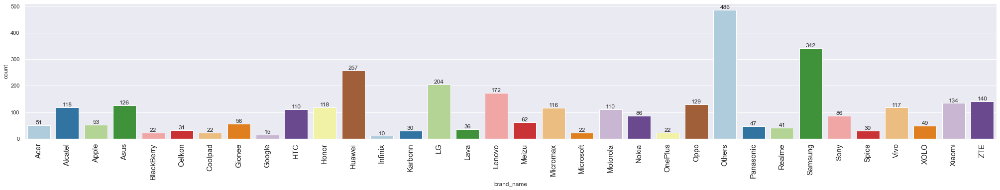

<IPython.core.display.Javascript object>

In [214]:
labeled_barplot(df_screen, "brand_name")

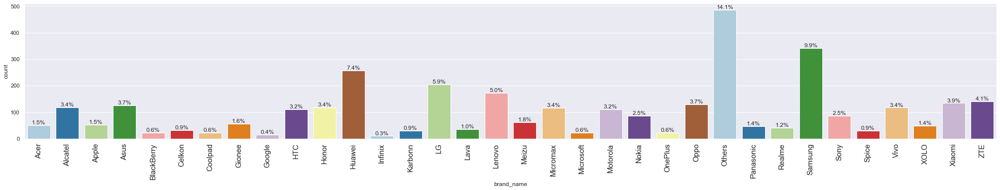

<IPython.core.display.Javascript object>

In [215]:
labeled_barplot(df_screen, "brand_name", perc=True)

### 6. Budget phones nowadays offer great selfie cameras, allowing us to capture our favorite moments with loved ones. What is the distribution of budget phones offering greater than 8MP selfie cameras across brands?

In [216]:
# Obtain missing values in selfie_camera_mp
print(df1["selfie_camera_mp"].isnull().sum())

2


<IPython.core.display.Javascript object>

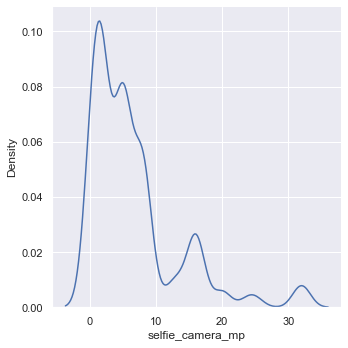

<IPython.core.display.Javascript object>

In [217]:
sns.displot(df1["selfie_camera_mp"], kind="kde")

For a skewed numerical variable, the median of the variable can be used to impute missing values.

In [218]:
# now using `fillna` with a numeric column
print(df1["selfie_camera_mp"].isnull().sum())
df1["selfie_camera_mp"].fillna(
    df1["selfie_camera_mp"].median(), inplace=True
)  # median imputation
df1["selfie_camera_mp"].isnull().sum()

2


0

<IPython.core.display.Javascript object>

In [219]:
print(df1.isnull().sum())

brand_name            0
os                    0
screen_size           0
4g                    0
5g                    0
main_camera_mp      180
selfie_camera_mp      0
int_memory           10
ram                   0
battery               0
weight                0
release_year          0
days_used             0
new_price             0
used_price            0
dtype: int64


<IPython.core.display.Javascript object>

In [220]:
df_budget = df[df.selfie_camera_mp > 8]
df_budget.head()

,brand_name,os,screen_size,4g,5g,main_camera_mp,selfie_camera_mp,int_memory,ram,battery,weight,release_year,days_used,new_price,used_price
1,Honor,Android,28.10,yes,yes,13.0,16.0,128.0,8.0,4300.0,213.0,2020,325,249.39,161.49
8,Honor,Android,15.72,yes,no,13.0,16.0,128.0,6.0,4000.0,165.0,2020,161,200.32,150.88
12,Honor,Android,24.29,yes,yes,13.0,16.0,128.0,8.0,4100.0,206.0,2019,537,499.68,249.81
13,Honor,Others,8.73,no,no,13.0,16.0,4.0,4.0,455.0,41.0,2019,432,179.62,89.77
14,Honor,Android,15.72,yes,no,13.0,16.0,64.0,4.0,4000.0,171.5,2019,336,221.13,144.87


<IPython.core.display.Javascript object>

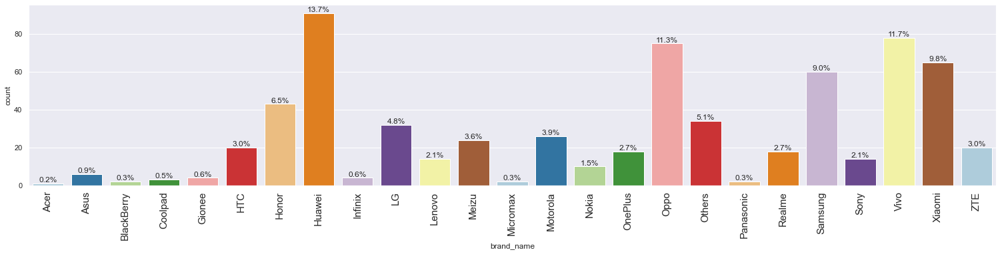

<IPython.core.display.Javascript object>

In [221]:
labeled_barplot(df_budget, "brand_name", perc=True)

* Huawei brand has the highest distribution of budget phones offering greater than 8MP selfie cameras across brands

#### Checking for more missing Values

In [222]:
print(df1.isnull().sum())

brand_name            0
os                    0
screen_size           0
4g                    0
5g                    0
main_camera_mp      180
selfie_camera_mp      0
int_memory           10
ram                   0
battery               0
weight                0
release_year          0
days_used             0
new_price             0
used_price            0
dtype: int64


<IPython.core.display.Javascript object>

* main_camera_mp and int_memory have missing values

In [223]:
for n in num_missing.value_counts().sort_index().index:
    if n > 0:
        print(f"For the rows with exactly {n} missing values, NAs are found in:")
        n_miss_per_col = df1[num_missing == n].isnull().sum()
        print(n_miss_per_col[n_miss_per_col > 0])
        print("\n\n")

For the rows with exactly 1 missing values, NAs are found in:
main_camera_mp    180
dtype: int64



For the rows with exactly 2 missing values, NAs are found in:
int_memory    8
dtype: int64



For the rows with exactly 3 missing values, NAs are found in:
int_memory    2
dtype: int64





<IPython.core.display.Javascript object>

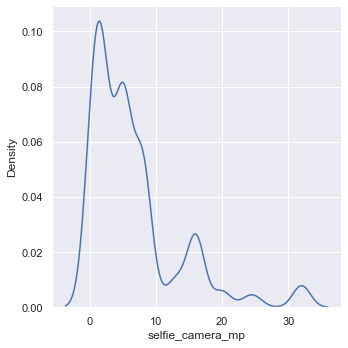

<IPython.core.display.Javascript object>

In [224]:
sns.displot(df1["selfie_camera_mp"], kind="kde")

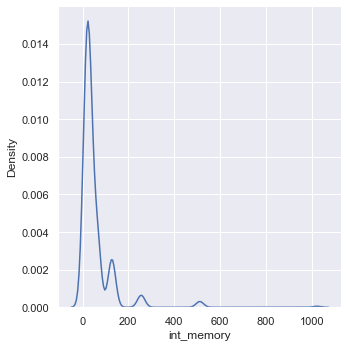

<IPython.core.display.Javascript object>

In [225]:
sns.displot(df1["int_memory"], kind="kde")

For a skewed numerical variable, the median of the variable can be used to impute missing values.

In [226]:
# now using `fillna` with a numeric column
print(df1["int_memory"].isnull().sum())
df1["int_memory"].fillna(df1["int_memory"].median(), inplace=True)  # median imputation
df1["int_memory"].isnull().sum()

10


0

<IPython.core.display.Javascript object>

In [227]:
# now using `fillna` with a numeric column
print(df1["main_camera_mp"].isnull().sum())
df1["main_camera_mp"].fillna(
    df1["main_camera_mp"].median(), inplace=True
)  # mean imputation
df1["main_camera_mp"].isnull().sum()

180


0

<IPython.core.display.Javascript object>

In [228]:
# Check missing values.
df1.isnull().sum()

brand_name          0
os                  0
screen_size         0
4g                  0
5g                  0
main_camera_mp      0
selfie_camera_mp    0
int_memory          0
ram                 0
battery             0
weight              0
release_year        0
days_used           0
new_price           0
used_price          0
dtype: int64

<IPython.core.display.Javascript object>

Observation
* There are no missing values

### 7.	Which attributes are highly correlated with the used phone price?

In [229]:
df1.corr()

,screen_size,main_camera_mp,selfie_camera_mp,int_memory,ram,battery,weight,release_year,days_used,new_price,used_price
screen_size,1.000000,0.166638,0.370246,0.144414,0.281956,0.740629,0.634900,0.454596,-0.397210,0.342092,0.385928
main_camera_mp,0.166638,1.000000,0.369802,-0.003483,0.166958,0.218573,-0.074680,0.304360,-0.108495,0.335540,0.243246
selfie_camera_mp,0.370246,0.369802,1.000000,0.283466,0.444877,0.344776,-0.005120,0.696427,-0.555775,0.397650,0.496052
int_memory,0.144414,-0.003483,0.283466,1.000000,0.079564,0.114099,0.018809,0.219439,-0.228819,0.343452,0.405106
ram,0.281956,0.166958,0.444877,0.079564,1.000000,0.233886,0.069661,0.311317,-0.286597,0.442767,0.522197
battery,0.740629,0.218573,0.344776,0.114099,0.233886,1.000000,0.701126,0.457270,-0.350715,0.341703,0.363711
weight,0.634900,-0.074680,-0.005120,0.018809,0.069661,0.701126,1.000000,0.062521,-0.059508,0.198173,0.170846
release_year,0.454596,0.304360,0.696427,0.219439,0.311317,0.457270,0.062521,1.000000,-0.748594,0.296972,0.456764
days_used,-0.397210,-0.108495,-0.555775,-0.228819,-0.286597,-0.350715,-0.059508,-0.748594,1.000000,-0.235613,-0.470760
new_price,0.342092,0.335540,0.397650,0.343452,0.442767,0.341703,0.198173,0.296972,-0.235613,1.000000,0.926087


<IPython.core.display.Javascript object>

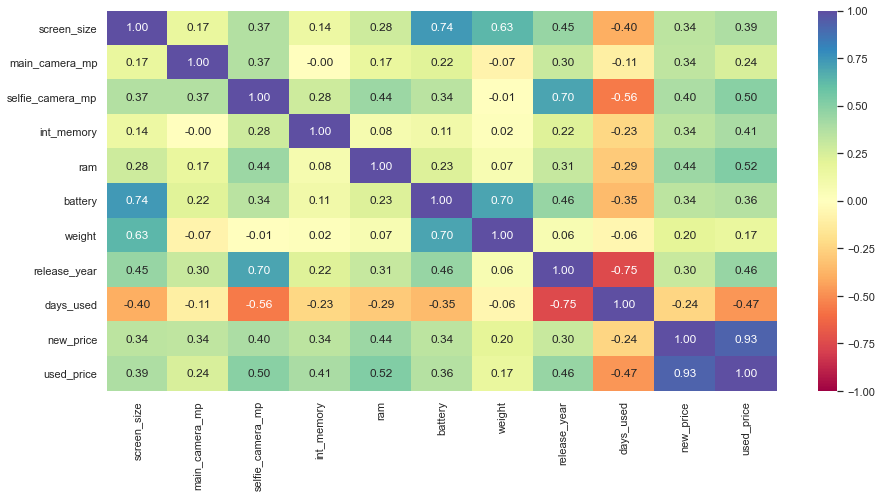

<IPython.core.display.Javascript object>

In [230]:
numeric_columns = df1.select_dtypes(include=np.number).columns.tolist()

# correlation heatmap
plt.figure(figsize=(15, 7))
sns.heatmap(
    df1[numeric_columns].corr(),
    annot=True,
    vmin=-1,
    vmax=1,
    fmt=".2f",
    cmap="Spectral",
)
plt.show()

Observations
* Used price is highly correlated with new_price of the phones
* Used Price is negatively correlated to days used
* Used price is positively correlated with other variables except days used

## Exploratory Data Analysis (EDA)

- It is a good idea to explore the data once again after manipulating it.

## Univariate Analysis

In [231]:
# function to plot a boxplot and a histogram along the same scale.


def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to show the density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="yellow"
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

<IPython.core.display.Javascript object>

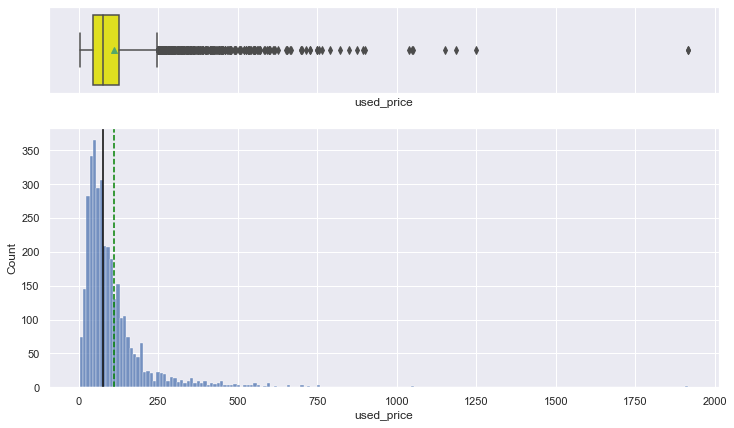

<IPython.core.display.Javascript object>

In [232]:
histogram_boxplot(df1, "used_price")

* The distribution of Used Price is right skewed.
* There are a outliers in this variable
* The mean for the used_price of phones is 109.880277 

## OS

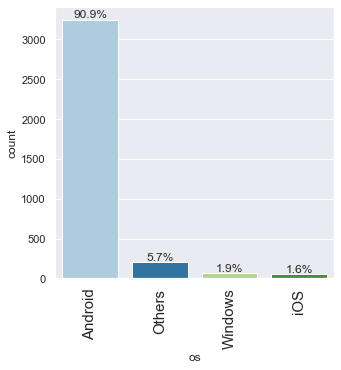

<IPython.core.display.Javascript object>

In [233]:
labeled_barplot(df1, "os", perc=True)

* iOS has the least percentage of the used phone market
* Android has the highest percentage of the used phone market

## Brand_name

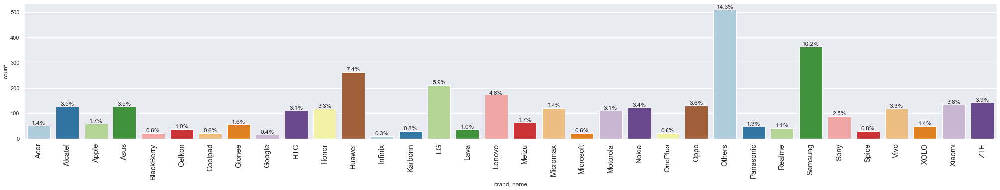

<IPython.core.display.Javascript object>

In [234]:
labeled_barplot(df1, "brand_name", perc=True)


* Other brand_name has the highest distrbution while Infinix has the lowest distributions

## 4g

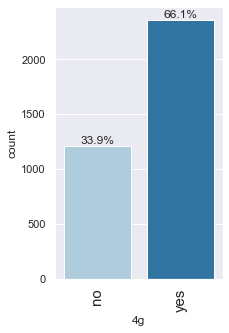

<IPython.core.display.Javascript object>

In [235]:
labeled_barplot(df1, "4g", perc=True)

* 66.1% of the users have availability of 4g

## 5g

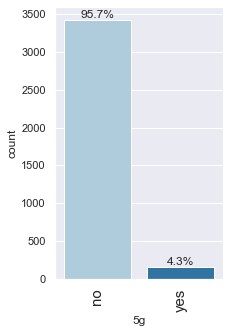

<IPython.core.display.Javascript object>

In [236]:
labeled_barplot(df1, "5g", perc=True)

* 95.7% of the users do not have availability of 5g network

### Bivariate Analysis

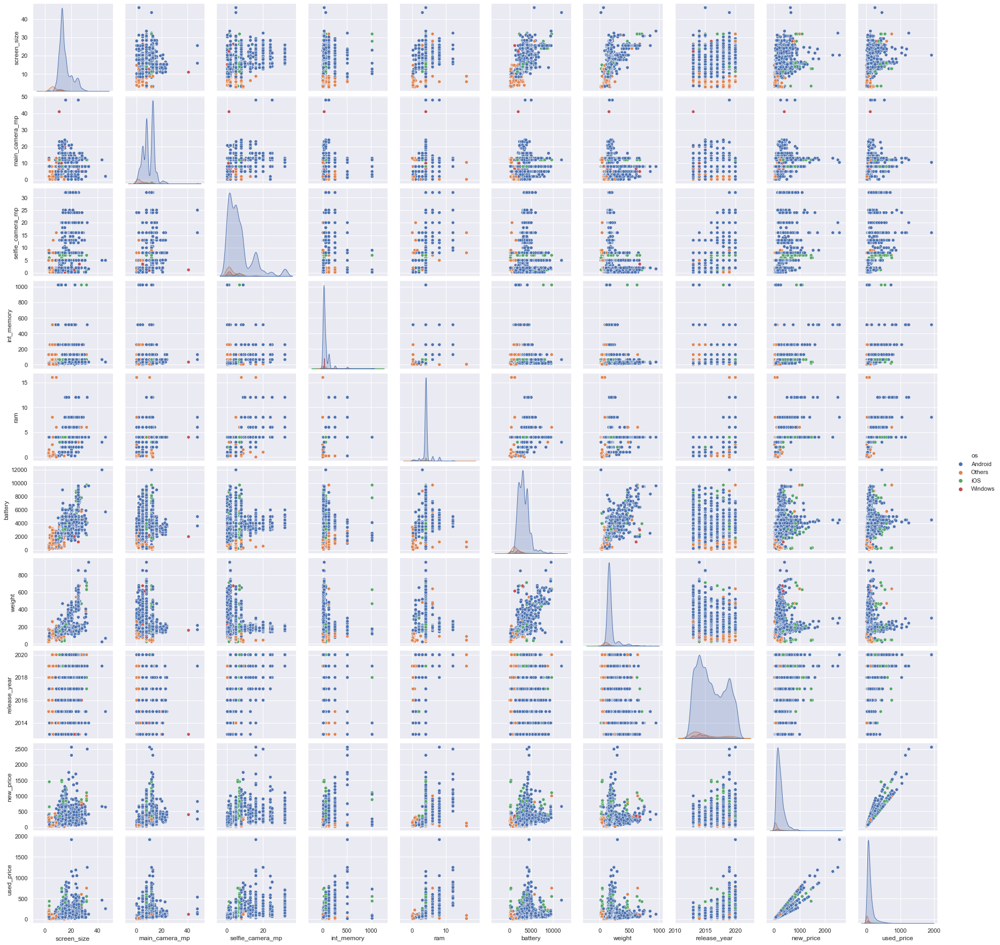

<IPython.core.display.Javascript object>

In [237]:
sns.pairplot(data=df1.drop(["days_used"], axis=1), hue="os")
plt.show()

*We can see varying distributions in variables for different operating systems, we should investigate it further.

### Correlation

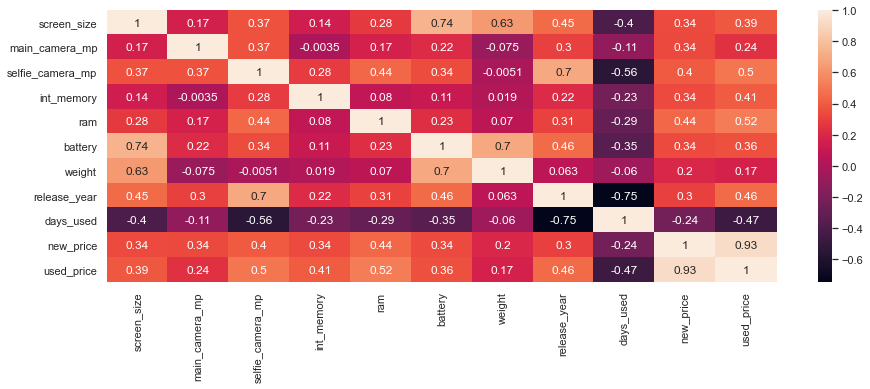

<IPython.core.display.Javascript object>

In [238]:
plt.figure(figsize=(15, 5))
sns.heatmap(df1.corr(), annot=True)
plt.show()

* Used price for phones is positively correlated with all other variables except days_used.
* Days_used is negatively correlated with all other variables

## Used Price Verses Release Year

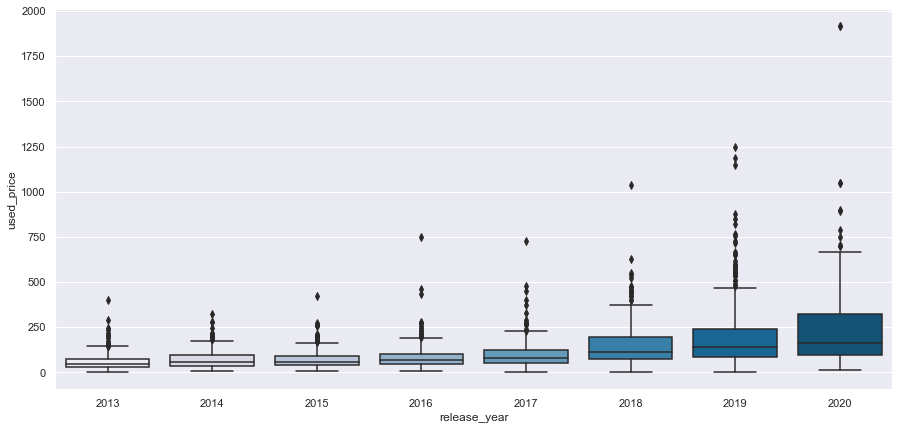

<IPython.core.display.Javascript object>

In [239]:
plt.figure(figsize=(15, 7))
sns.boxplot(df1["release_year"], df1["used_price"], palette="PuBu")
plt.show()

* 2020 had the most refurbished phone prices released


## Used Price Verses OS

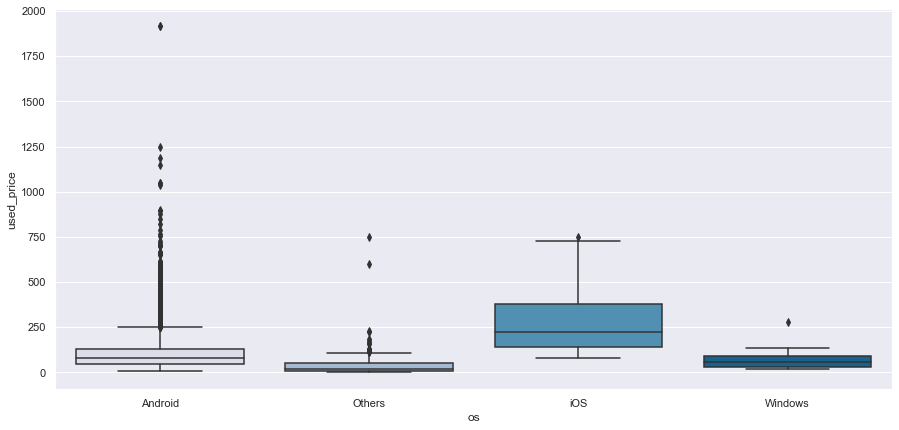

<IPython.core.display.Javascript object>

In [240]:
plt.figure(figsize=(15, 7))
sns.boxplot(df1["os"], df1["used_price"], palette="PuBu")
plt.show()

* iOS customers have the highest used_prices than the other operating systems

## Used Price Vs Brand Name

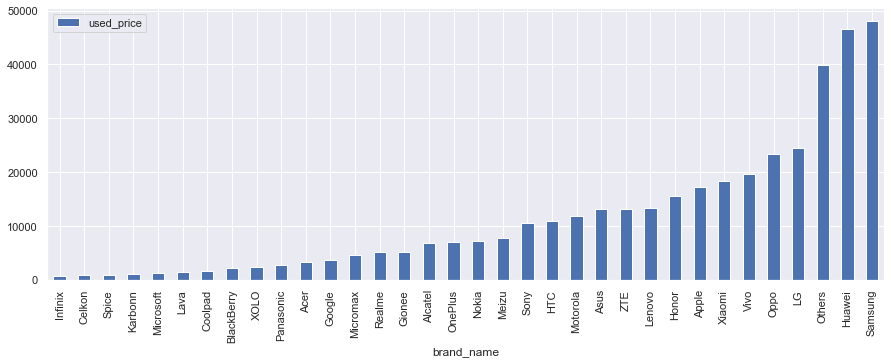

<IPython.core.display.Javascript object>

In [241]:
df1.groupby(by=["brand_name"])["used_price"].sum().reset_index().sort_values(
    ["used_price"]
).plot(x="brand_name", y="used_price", kind="bar", figsize=(15, 5))
plt.show()

* Samsung brand has the highest price on the used/refurbished phones

## Used Price on 4g 

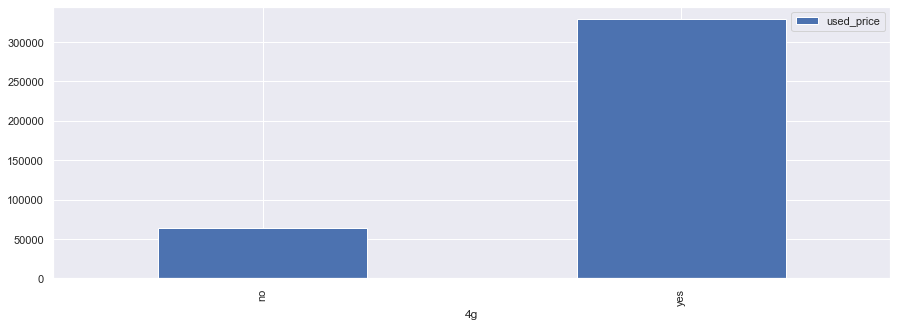

<IPython.core.display.Javascript object>

In [242]:
df1.groupby(by=["4g"])["used_price"].sum().reset_index().sort_values(
    ["used_price"]
).plot(x="4g", y="used_price", kind="bar", figsize=(15, 5))
plt.show()

* 4g is mostly available to many customers on the Used phones

## Used Price on 5g 

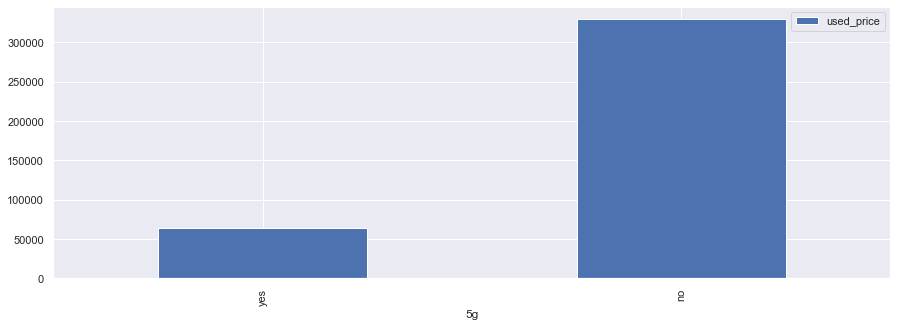

<IPython.core.display.Javascript object>

In [243]:
df1.groupby(by=["5g"])["used_price"].sum().reset_index().sort_values(
    ["used_price"]
).plot(x="5g", y="used_price", kind="bar", figsize=(15, 5))
plt.show()

* 5g is NOT mostly available to many customers on the Used phones

### Used Price Vs main_camera_mp

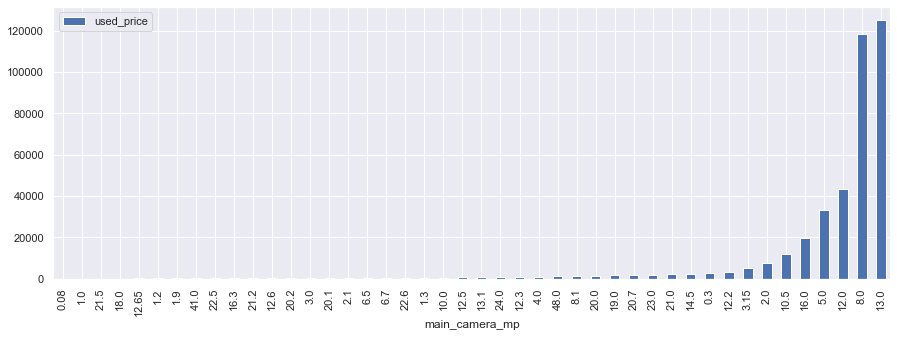

<IPython.core.display.Javascript object>

In [244]:
df1.groupby(by=["main_camera_mp"])["used_price"].sum().reset_index().sort_values(
    ["used_price"]
).plot(x="main_camera_mp", y="used_price", kind="bar", figsize=(15, 5))
plt.show()

* Resolution of the rear camera in megapixels is highest at 13 on the used phone.
* Resolution of the rear camera in megapixels is lowest at 12.5 on the used phone.


### Used Price Vs selfie_camera_mp

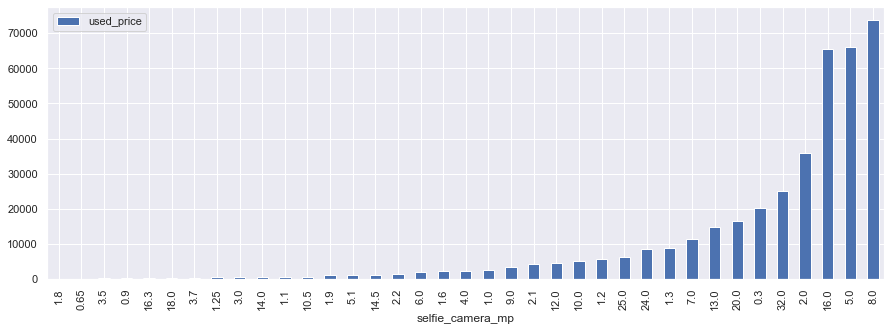

<IPython.core.display.Javascript object>

In [245]:
df1.groupby(by=["selfie_camera_mp"])["used_price"].sum().reset_index().sort_values(
    ["used_price"]
).plot(x="selfie_camera_mp", y="used_price", kind="bar", figsize=(15, 5))
plt.show()

* Resolution of the front camera in megapixels is highest at 8 on the used phone and lowest at 1.25

### Used Price Vs selfie_camera_mp

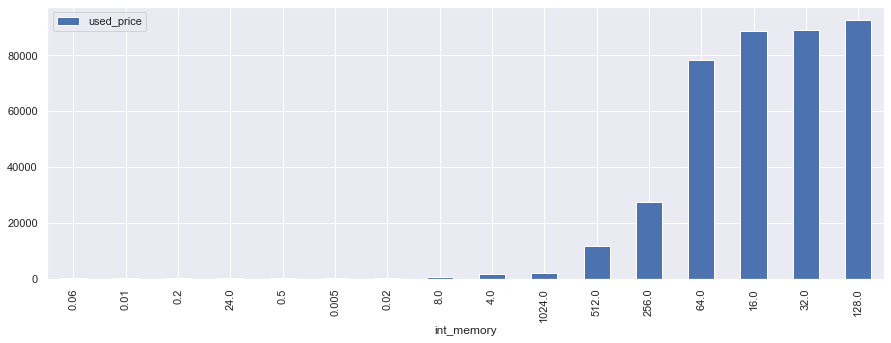

<IPython.core.display.Javascript object>

In [246]:
df1.groupby(by=["int_memory"])["used_price"].sum().reset_index().sort_values(
    ["used_price"]
).plot(x="int_memory", y="used_price", kind="bar", figsize=(15, 5))
plt.show()

* Amount of internal memory (ROM) in GB is highest at 128GB and lowest at 8GB

### Used Price Vs Ram

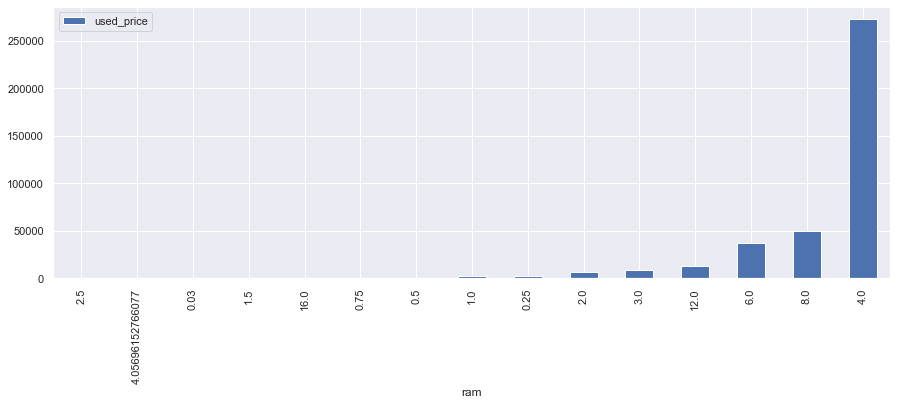

<IPython.core.display.Javascript object>

In [247]:
df1.groupby(by=["ram"])["used_price"].sum().reset_index().sort_values(
    ["used_price"]
).plot(x="ram", y="used_price", kind="bar", figsize=(15, 5))
plt.show()

* Amount of RAM in GB is highest at 4 GB

# Outliers

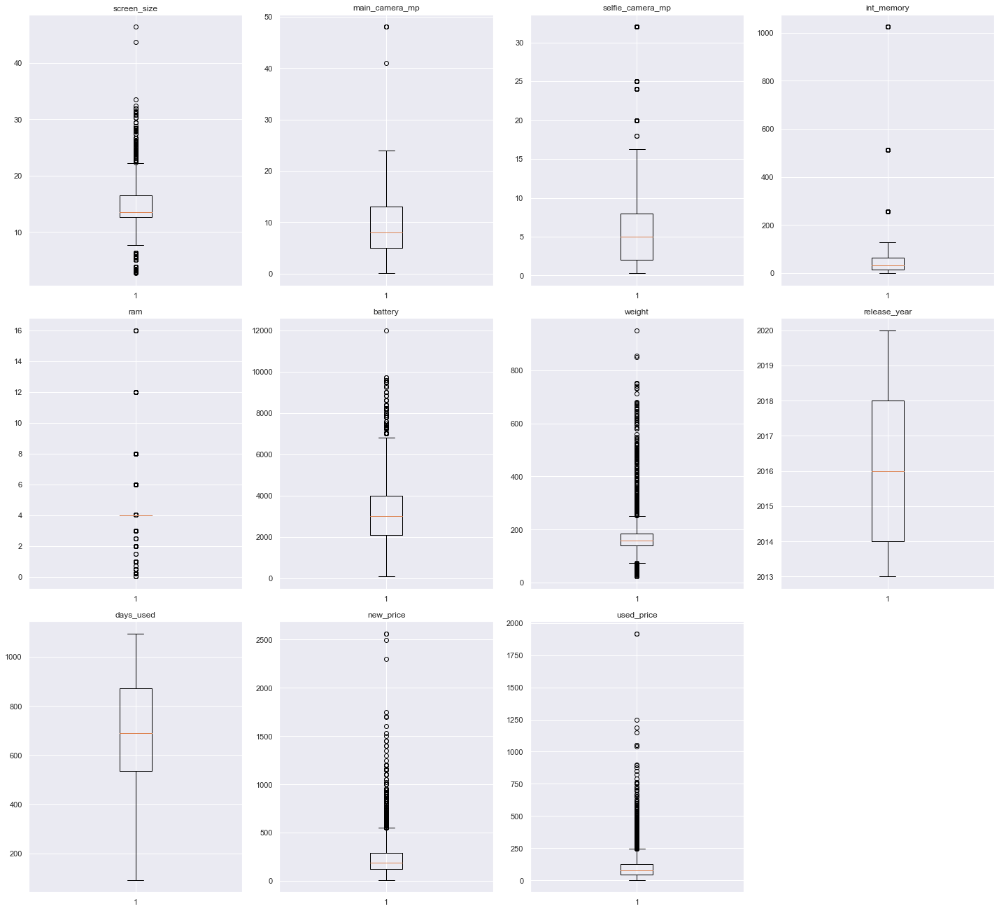

<IPython.core.display.Javascript object>

In [248]:
# let's plot the boxplots of all columns to check for outliers
plt.figure(figsize=(20, 30))

for i, variable in enumerate(numeric_columns):
    plt.subplot(5, 4, i + 1)
    plt.boxplot(df1[variable], whis=1.5)
    plt.tight_layout()
    plt.title(variable)

plt.show()

* Outliers are present on screen_size,new_price,used_price,ram,battery,weight,int_memory,screen_size,main camera_mp and selfie camera_mp.
* days_used and release year have no outliers

### Outlier Treatment

- Let's treat outliers in the data by flooring and capping.

In [249]:
def treat_outliers(df1, col):
    """
    treats outliers in a variable
    col: str, name of the numerical variable
    df1: dataframe
    col: name of the column
    """
    Q1 = df1[col].quantile(0.25)  # 25th quantile
    Q3 = df1[col].quantile(0.75)  # 75th quantile
    IQR = Q3 - Q1
    Lower_Whisker = Q1 - 1.5 * IQR
    Upper_Whisker = Q3 + 1.5 * IQR

    # all the values smaller than Lower_Whisker will be assigned the value of Lower_Whisker
    # all the values greater than Upper_Whisker will be assigned the value of Upper_Whisker
    df1[col] = np.clip(df1[col], Lower_Whisker, Upper_Whisker)

    return df1


def treat_outliers_all(df1, col_list):
    """
    treat outlier in all numerical variables
    col_list: list of numerical variables
    df: data frame
    """
    for c in col_list:
        df1 = treat_outliers(df1, c)

    return df1

<IPython.core.display.Javascript object>

In [250]:
# treating the outliers
numerical_col = df1.select_dtypes(include=np.number).columns.tolist()
df1 = treat_outliers_all(df1, numerical_col)

<IPython.core.display.Javascript object>

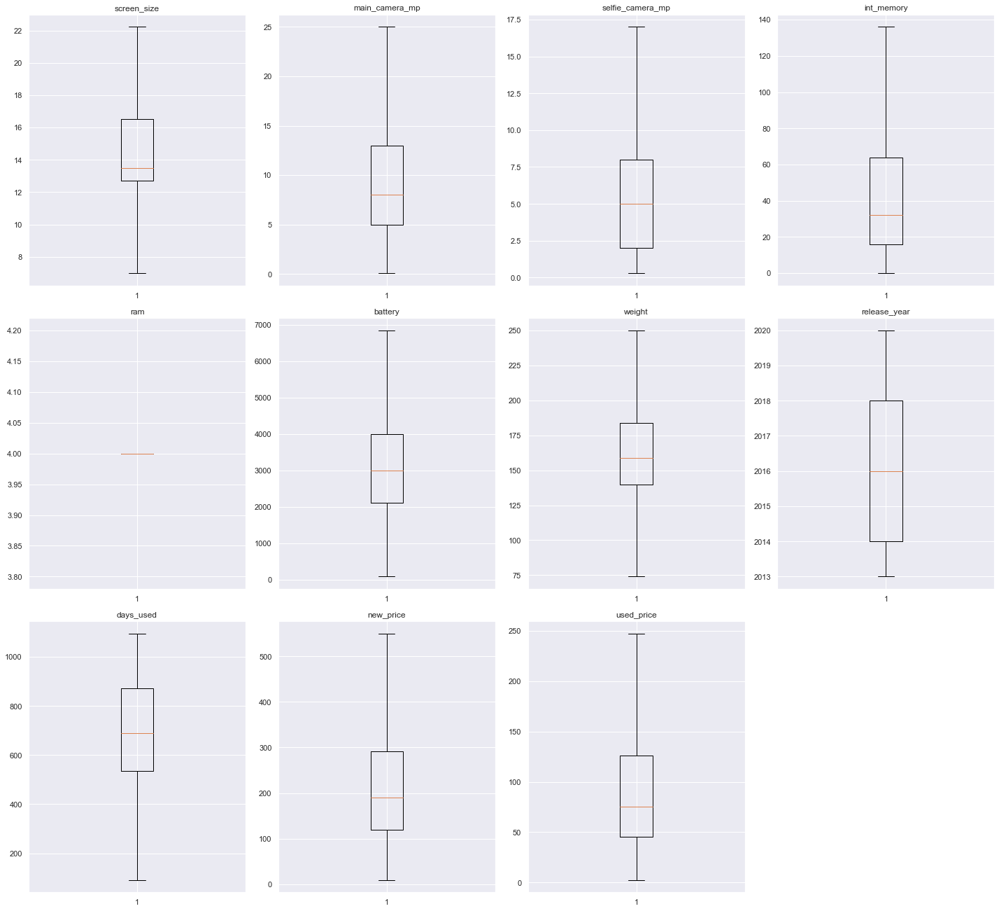

<IPython.core.display.Javascript object>

In [251]:
# let's look at the boxplots to see if the outliers have been treated or not
plt.figure(figsize=(20, 30))

for i, variable in enumerate(numeric_columns):
    plt.subplot(5, 4, i + 1)
    plt.boxplot(df1[variable], whis=1.5)
    plt.tight_layout()
    plt.title(variable)

plt.show()

* No outliers present

## Building a Linear Regression model

1. We want to predict the price of a used phone 

2. Before we proceed to build a model, we'll have to encode categorical features.

3. We'll split the data into train and test to be able to evaluate the model that we build on the train data.

4. We will build a Linear Regression model using the train data and then check it's performance.

## Model performance evaluation

## Remove constant column

In [81]:
df1.loc[:, (df1 != df1.iloc[0]).any()]

,brand_name,os,screen_size,4g,5g,main_camera_mp,selfie_camera_mp,int_memory,battery,weight,release_year,days_used,new_price,used_price
0,Honor,Android,22.225,yes,no,13.0,5.0,64.0,3020.0,146.0,2020,127,111.6200,86.9600
1,Honor,Android,22.225,yes,yes,13.0,16.0,128.0,4300.0,213.0,2020,325,249.3900,161.4900
2,Honor,Android,22.225,yes,yes,13.0,8.0,128.0,4200.0,213.0,2020,162,359.4700,247.1925
3,Honor,Android,22.225,yes,yes,13.0,8.0,64.0,6850.0,250.0,2020,345,278.9300,180.2300
4,Honor,Android,15.720,yes,no,13.0,8.0,64.0,5000.0,185.0,2020,293,140.8700,103.8000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3566,Asus,Android,15.880,yes,no,8.0,8.0,64.0,5000.0,190.0,2019,232,549.6425,247.1925
3567,Asus,Android,15.240,yes,no,13.0,8.0,128.0,4000.0,200.0,2018,541,518.8145,247.1925
3568,Alcatel,Android,18.730,yes,no,13.0,5.0,32.0,4000.0,165.0,2020,201,92.6500,69.8100
3569,Alcatel,Android,18.730,yes,no,13.0,5.0,32.0,4000.0,160.0,2020,149,101.9150,76.0700


<IPython.core.display.Javascript object>

## Split Data

In [82]:
# defining X and y variables
X = df1.drop(["used_price","ram"], axis=1)
y = df1["used_price"]

print(X.head())
print(y.head())


  brand_name       os  screen_size   4g   5g  main_camera_mp  \
0      Honor  Android       22.225  yes   no            13.0   
1      Honor  Android       22.225  yes  yes            13.0   
2      Honor  Android       22.225  yes  yes            13.0   
3      Honor  Android       22.225  yes  yes            13.0   
4      Honor  Android       15.720  yes   no            13.0   

   selfie_camera_mp  int_memory  battery  weight  release_year  days_used  \
0               5.0        64.0   3020.0   146.0          2020        127   
1              16.0       128.0   4300.0   213.0          2020        325   
2               8.0       128.0   4200.0   213.0          2020        162   
3               8.0        64.0   6850.0   250.0          2020        345   
4               8.0        64.0   5000.0   185.0          2020        293   

   new_price  
0     111.62  
1     249.39  
2     359.47  
3     278.93  
4     140.87  
0     86.9600
1    161.4900
2    247.1925
3    180.2300
4    1

<IPython.core.display.Javascript object>

In [83]:
df1.dtypes

brand_name           object
os                   object
screen_size         float64
4g                   object
5g                   object
main_camera_mp      float64
selfie_camera_mp    float64
int_memory          float64
ram                 float64
battery             float64
weight              float64
release_year          int64
days_used             int64
new_price           float64
used_price          float64
dtype: object

<IPython.core.display.Javascript object>

In [84]:
X = pd.get_dummies(
    X, columns=X.select_dtypes(include=["object"]).columns.tolist(), drop_first=True,
)
X.head()

,screen_size,main_camera_mp,selfie_camera_mp,int_memory,battery,weight,release_year,days_used,new_price,brand_name_Alcatel,brand_name_Apple,brand_name_Asus,brand_name_BlackBerry,brand_name_Celkon,brand_name_Coolpad,brand_name_Gionee,brand_name_Google,brand_name_HTC,brand_name_Honor,brand_name_Huawei,brand_name_Infinix,brand_name_Karbonn,brand_name_LG,brand_name_Lava,brand_name_Lenovo,brand_name_Meizu,brand_name_Micromax,brand_name_Microsoft,brand_name_Motorola,brand_name_Nokia,brand_name_OnePlus,brand_name_Oppo,brand_name_Others,brand_name_Panasonic,brand_name_Realme,brand_name_Samsung,brand_name_Sony,brand_name_Spice,brand_name_Vivo,brand_name_XOLO,brand_name_Xiaomi,brand_name_ZTE,os_Others,os_Windows,os_iOS,4g_yes,5g_yes
0,22.225,13.0,5.0,64.0,3020.0,146.0,2020,127,111.62,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
1,22.225,13.0,16.0,128.0,4300.0,213.0,2020,325,249.39,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1
2,22.225,13.0,8.0,128.0,4200.0,213.0,2020,162,359.47,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1
3,22.225,13.0,8.0,64.0,6850.0,250.0,2020,345,278.93,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1
4,15.720,13.0,8.0,64.0,5000.0,185.0,2020,293,140.87,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


<IPython.core.display.Javascript object>

In [85]:
df1.dtypes

brand_name           object
os                   object
screen_size         float64
4g                   object
5g                   object
main_camera_mp      float64
selfie_camera_mp    float64
int_memory          float64
ram                 float64
battery             float64
weight              float64
release_year          int64
days_used             int64
new_price           float64
used_price          float64
dtype: object

<IPython.core.display.Javascript object>

## Fit Linear Model

In [86]:
# splitting the data in 70:30 ratio for train to test data

x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

<IPython.core.display.Javascript object>

In [87]:
print("Number of rows in train data =", x_train.shape[0])
print("Number of rows in test data =", x_test.shape[0])

Number of rows in train data = 2499
Number of rows in test data = 1072


<IPython.core.display.Javascript object>

In [88]:
# fitting the model on the train data (70% of the whole data)
from sklearn.linear_model import LinearRegression

linearregression = LinearRegression()
linearregression.fit(x_train, y_train)

LinearRegression()

<IPython.core.display.Javascript object>

**Let's check the coefficients and intercept of the model.**

In [89]:
coef_df = pd.DataFrame(
    np.append(linearregression.coef_, linearregression.intercept_),
    index=x_train.columns.tolist() + ["Intercept"],
    columns=["Coefficients"],
)

coef_df

,Coefficients
screen_size,0.403779
main_camera_mp,-0.438579
selfie_camera_mp,0.837275
int_memory,0.106295
battery,-0.000111
weight,-0.015872
release_year,-0.292805
days_used,-0.084452
new_price,0.379859
brand_name_Alcatel,1.844760


<IPython.core.display.Javascript object>

**Let's check the performance of the model using different metrics.**

* We will be using metric functions defined in sklearn for RMSE, MAE, and $R^2$.
* We will define a function to calculate MAPE and adjusted $R^2$.
    - The mean absolute percentage error (MAPE) measures the accuracy of predictions as a percentage, and can be calculated as the average absolute percent error for each predicted value minus actual values divided by actual values. It works best if there are no extreme values in the data and none of the actual values are 0.
    
* We will create a function which will print out all the above metrics in one go.

## Linear Regression using statsmodels

- Let's build a linear regression model using statsmodels.

In [90]:
# function to compute adjusted R-squared
def adj_r2_score(predictors, targets, predictions):
    r2 = r2_score(targets, predictions)
    n = predictors.shape[0]
    k = predictors.shape[1]
    return 1 - ((1 - r2) * (n - 1) / (n - k - 1))


# function to compute MAPE
def mape_score(targets, predictions):
    return np.mean(np.abs(targets - predictions) / targets) * 100


# function to compute different metrics to check performance of a regression model
def model_performance_regression(model, predictors, target):
    """
    Function to compute different metrics to check regression model performance

    model: regressor
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    r2 = r2_score(target, pred)  # to compute R-squared
    adjr2 = adj_r2_score(predictors, target, pred)  # to compute adjusted R-squared
    rmse = np.sqrt(mean_squared_error(target, pred))  # to compute RMSE
    mae = mean_absolute_error(target, pred)  # to compute MAE
    mape = mape_score(target, pred)  # to compute MAPE

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "RMSE": rmse,
            "MAE": mae,
            "R-squared": r2,
            "Adj. R-squared": adjr2,
            "MAPE": mape,
        },
        index=[0],
    )

    return df_perf

<IPython.core.display.Javascript object>

In [91]:
# checking model performance on train set (seen 70% data)
print("Training Performance\n")
linearregression_train_perf = model_performance_regression(
    linearregression, x_train, y_train
)
linearregression_train_perf

Training Performance



,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,13.685352,10.126696,0.957179,0.956358,17.780387


<IPython.core.display.Javascript object>

In [92]:
# checking model performance on test set (seen 30% data)
print("Test Performance\n")
linearregression_test_perf = model_performance_regression(
    linearregression, x_test, y_test
)
linearregression_test_perf

Test Performance



,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,14.541195,10.519978,0.951665,0.949447,18.455811


<IPython.core.display.Javascript object>

**Observations**

- The training $R^2$ is 95.7%, indicating that the model explains 95.7% of the variation in the train data. So, the model is not underfitting.

- MAE and RMSE on the train and test sets are comparable, which shows that the model is not overfitting.

- MAE indicates that our current model is able to predict used price for refurbished phones within a mean error of 10.5 years on the test data.

- MAPE on the test set suggests we can predict within 18.46% of the used_price of the phones

In [93]:
# unlike sklearn, statsmodels does not add a constant to the data on its own
# we have to add the constant manually
x_train1 = sm.add_constant(x_train)
# adding constant to the test data
x_test1 = sm.add_constant(x_test)

olsmod0 = sm.OLS(y_train, x_train1).fit()
print(olsmod0.summary())

                            OLS Regression Results                            
Dep. Variable:             used_price   R-squared:                       0.957
Model:                            OLS   Adj. R-squared:                  0.956
Method:                 Least Squares   F-statistic:                     1166.
Date:                Wed, 29 Sep 2021   Prob (F-statistic):               0.00
Time:                        13:34:53   Log-Likelihood:                -10084.
No. Observations:                2499   AIC:                         2.026e+04
Df Residuals:                    2451   BIC:                         2.054e+04
Df Model:                          47                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                   650.68

<IPython.core.display.Javascript object>

Observations

Negative values of the coefficient show that the price of a used phone  decreases with the increase of corresponding attribute value.

Positive values of the coefficient show that the price of a used phone  increases with the increase of corresponding attribute value.

p-value of a variable indicates if the variable is significant or not. If we consider the significance level to be 0.05 (5%), then any variable with a p-value less than 0.05 would be considered significant.

But these variables might contain multicollinearity, which will affect the p-values.

So, we need to deal with multicollinearity and check the other assumptions of linear regression first, and then look at the p-values.

### Drop Dummy Variables p>0.05

In [94]:
# defining X and y variables
X1 = X.drop(['battery',
'weight',
'release_year',
'brand_name_Alcatel',
'brand_name_Apple',
'brand_name_Asus',
'brand_name_Celkon',
'brand_name_Coolpad',
'brand_name_Gionee',
'brand_name_HTC',
'brand_name_Honor',
'brand_name_Huawei',
'brand_name_Karbonn',
'brand_name_LG',
'brand_name_Lava',
'brand_name_Lenovo',
'brand_name_Meizu',
'brand_name_Micromax',
'brand_name_Microsoft',
'brand_name_Motorola',
'brand_name_Oppo',
'brand_name_Others',
'brand_name_Panasonic',
'brand_name_Realme',
'brand_name_Samsung',
'brand_name_Sony',
'brand_name_Spice',
'brand_name_Vivo',
'brand_name_XOLO',
'brand_name_Xiaomi',
'brand_name_ZTE',
'os_Windows',
'4g_yes',
'5g_yes'
], axis=1)
y1 = df1["used_price"]

print(X1.head())
print(y1.head())


   screen_size  main_camera_mp  selfie_camera_mp  int_memory  days_used  \
0       22.225            13.0               5.0        64.0        127   
1       22.225            13.0              16.0       128.0        325   
2       22.225            13.0               8.0       128.0        162   
3       22.225            13.0               8.0        64.0        345   
4       15.720            13.0               8.0        64.0        293   

   new_price  brand_name_BlackBerry  brand_name_Google  brand_name_Infinix  \
0     111.62                      0                  0                   0   
1     249.39                      0                  0                   0   
2     359.47                      0                  0                   0   
3     278.93                      0                  0                   0   
4     140.87                      0                  0                   0   

   brand_name_Nokia  brand_name_OnePlus  os_Others  os_iOS  
0                 0

<IPython.core.display.Javascript object>

* The below dummy variables have P>0.05 and should be dropped then the regression run again, and the p-values of all the variables should be checked.
screen_size,battery,weight,release_year,brand_name_Alcatel,brand_name_Asus,brand_name_BlackBerry,brand_name_Celkon,
brand_name_Coolpad,brand_name_Gionee,brand_name_HTC,brand_name_Honor,brand_name_Huawei,brand_name_Karbonn,
brand_name_LG,brand_name_Lava,brand_name_Lenovo,brand_name_Meizu,brand_name_Micromax,brand_name_Microsoft,
brand_name_Motorola,brand_name_Oppo,brand_name_Others,brand_name_Panasonic,brand_name_Realme,
brand_name_Samsung,brand_name_Sony,brand_name_Spice,brand_name_Vivo,brand_name_XOLO,brand_name_Xiaomi,
brand_name_ZTE,os_Windows,os_iOS,5g_yes,


The dummy variables with p-value > 0.05 should be dropped one by one until there are no such variables. After removing each high p-value variable, the regression should be run again, and the p-values of all the variables should be checked.

If all the dummy variables of a categorical column have a p-value > 0.05, then all the dummy variables for that column can be dropped at once.

### New Dummy

In [95]:
X1 = pd.get_dummies(
    X1, columns=X1.select_dtypes(include=["object"]).columns.tolist(), drop_first=True,
)
X1.head()

,screen_size,main_camera_mp,selfie_camera_mp,int_memory,days_used,new_price,brand_name_BlackBerry,brand_name_Google,brand_name_Infinix,brand_name_Nokia,brand_name_OnePlus,os_Others,os_iOS
0,22.225,13.0,5.0,64.0,127,111.62,0,0,0,0,0,0,0
1,22.225,13.0,16.0,128.0,325,249.39,0,0,0,0,0,0,0
2,22.225,13.0,8.0,128.0,162,359.47,0,0,0,0,0,0,0
3,22.225,13.0,8.0,64.0,345,278.93,0,0,0,0,0,0,0
4,15.720,13.0,8.0,64.0,293,140.87,0,0,0,0,0,0,0


<IPython.core.display.Javascript object>

In [96]:
# splitting the data in 70:30 ratio for train to test data

x1_train, x1_test, y1_train, y1_test = train_test_split(
    X1, y1, test_size=0.3, random_state=1
)

<IPython.core.display.Javascript object>

In [97]:
print("Number of rows in train data =", x1_train.shape[0])
print("Number of rows in test data =", x1_test.shape[0])

Number of rows in train data = 2499
Number of rows in test data = 1072


<IPython.core.display.Javascript object>

In [98]:
# fitting the model on the train data (70% of the whole data)
from sklearn.linear_model import LinearRegression

linearregression = LinearRegression()
linearregression.fit(x1_train, y1_train)

LinearRegression()

<IPython.core.display.Javascript object>

In [99]:
# unlike sklearn, statsmodels does not add a constant to the data on its own
# we have to add the constant manually
x1_train1 = sm.add_constant(x1_train)
# adding constant to the test data
x1_test1 = sm.add_constant(x1_test)

olsmod1 = sm.OLS(y1_train, x1_train1).fit()
print(olsmod1.summary())

                            OLS Regression Results                            
Dep. Variable:             used_price   R-squared:                       0.956
Model:                            OLS   Adj. R-squared:                  0.956
Method:                 Least Squares   F-statistic:                     4175.
Date:                Wed, 29 Sep 2021   Prob (F-statistic):               0.00
Time:                        13:34:54   Log-Likelihood:                -10112.
No. Observations:                2499   AIC:                         2.025e+04
Df Residuals:                    2485   BIC:                         2.033e+04
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    60.82

<IPython.core.display.Javascript object>

Now no feature has p-value greater than 0.05, so we'll consider the features in x_train1 as the final ones and olsmod1 as final model.

**Observations**

* Now adjusted R-squared is 0.956, i.e., our model is able to explain ~96% of the variance. This shows that the model is good.
* The adjusted R-squared in *olsmod0* (where we considered all the variables) was 0.956. This shows that the variables we dropped were not affecting the model much.

## Checking Linear Regression Assumptions

- In order to make statistical inferences from a linear regression model, it is important to ensure that the assumptions of linear regression are satisfied.

We will be checking the following Linear Regression assumptions:

1. **No Multicollinearity**

2. **Linearity of variables**

3. **Independence of error terms**

4. **Normality of error terms**

5. **No Heteroscedasticity**

### TEST FOR MULTICOLLINEARITY

* Multicollinearity occurs when predictor variables in a regression model are correlated. This correlation is a problem because predictor variables should be independent. If the correlation between variables is high, it can cause problems when we fit the model and interpret the results. When we have multicollinearity in the linear model, the coefficients that the model suggests are unreliable.

* There are different ways of detecting (or testing) multicollinearity. One such way is by using the Variance Inflation Factor, or VIF.

* **Variance  Inflation Factor (VIF)**:  Variance inflation factors measure the inflation in the variances of the regression parameter estimates due to collinearities that exist among the predictors. It is a measure of how much the variance of the estimated regression coefficient $\beta_k$ is "inflated" by the existence of correlation among the predictor variables in the model.
    - If VIF is 1, then there is no correlation among the $k$th predictor and the remaining predictor variables, and hence, the variance of $\beta_k$ is not inflated at all.

* **General Rule of thumb**:
    - If VIF is between 1 and 5, then there is low multicollinearity.
    - If VIF is between 5 and 10, we say there is moderate multicollinearity.
    - If VIF is exceeding 10, it shows signs of high multicollinearity.

In [100]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# we will define a function to check VIF
def checking_vif(predictors):
    vif = pd.DataFrame()
    vif["feature"] = predictors.columns

    # calculating VIF for each feature
    vif["VIF"] = [
        variance_inflation_factor(predictors.values, i)
        for i in range(len(predictors.columns))
    ]
    return vif

<IPython.core.display.Javascript object>

In [101]:
checking_vif(x1_train1)

,feature,VIF
0,const,50.148938
1,screen_size,1.647802
2,main_camera_mp,1.612672
3,selfie_camera_mp,2.659935
4,int_memory,1.955887
5,days_used,1.789584
6,new_price,1.914426
7,brand_name_BlackBerry,1.036322
8,brand_name_Google,1.008387
9,brand_name_Infinix,1.018220


<IPython.core.display.Javascript object>

* There is low multicollinearity.

### TEST FOR LINEARITY AND INDEPENDENCE

**Why the test?**

* Linearity describes a straight-line relationship between two variables, predictor variables must have a linear relation with the dependent variable.
* The independence of the error terms (or residuals) is important. If the residuals are not independent, then the confidence intervals of the coefficient estimates will be narrower and make us incorrectly conclude a parameter to be statistically significant.

**How to check linearity and independence?**

- Make a plot of fitted values vs residuals.
- If they don't follow any pattern, then we say the model is linear and residuals are independent.
- Otherwise, the model is showing signs of non-linearity and residuals are not independent.

**How to fix if this assumption is not followed?**

* We can try to transform the variables and make the relationships linear.

In [102]:
# let us create a dataframe with actual, fitted and residual values
df_pred = pd.DataFrame()

df_pred["Actual Values"] = y1_train  # actual values
df_pred["Fitted Values"] = olsmod1.fittedvalues  # predicted values
df_pred["Residuals"] = olsmod1.resid  # residuals

df_pred.head()

,Actual Values,Fitted Values,Residuals
1248,98.87,108.704942,-9.834942
2206,132.62,144.701622,-12.081622
1623,25.27,38.473596,-13.203596
2245,104.26,109.138672,-4.878672
1043,39.22,50.646450,-11.426450


<IPython.core.display.Javascript object>

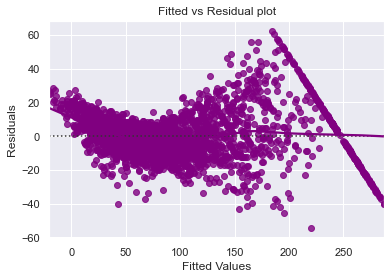

<IPython.core.display.Javascript object>

In [103]:
# let's plot the fitted values vs residuals

sns.residplot(
    data=df_pred, x="Fitted Values", y="Residuals", color="purple", lowess=True
)
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Fitted vs Residual plot")
plt.show()

* The scatter plot shows the distribution of residuals (errors) vs fitted values (predicted values).

* If there exist any pattern in this plot, we consider it as signs of non-linearity in the data and a pattern means that the model doesn't capture non-linear effects.

* **We see no pattern in the plot above. Hence, the assumptions of linearity and independence are satisfied.**

### TEST FOR NORMALITY

**Why the test?**

* Error terms, or residuals, should be normally distributed. If the error terms are not normally distributed, confidence intervals of the coefficient estimates may become too wide or narrow. Once confidence interval becomes unstable, it leads to difficulty in estimating coefficients based on minimization of least squares. Non-normality suggests that there are a few unusual data points that must be studied closely to make a better model.

**How to check normality?**

* The shape of the histogram of residuals can give an initial idea about the normality.
* It can also be checked via a Q-Q plot of residuals. If the residuals follow a normal distribution, they will make a straight line plot, otherwise not.
* Other tests to check for normality includes the Shapiro-Wilk test.
    - Null hypothesis: Residuals are normally distributed
    - Alternate hypothesis: Residuals are not normally distributed

**How to fix if this assumption is not followed?**

* We can apply transformations like log, exponential, arcsinh, etc. as per our data.

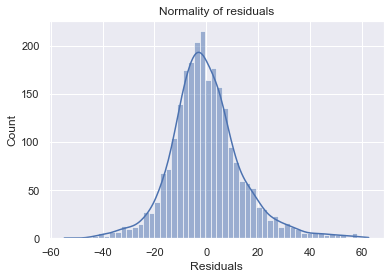

<IPython.core.display.Javascript object>

In [104]:
sns.histplot(data=df_pred, x="Residuals", kde=True)
plt.title("Normality of residuals")
plt.show()

In [105]:
print(
    "Average error:"
    + str(np.mean(df_pred.Residuals))
    + " Std dev:"
    + str(np.std(df_pred.Residuals))
)

Average error:1.298339853662003e-13 Std dev:13.837916525369899


<IPython.core.display.Javascript object>

- The histogram of residuals does have a bell shape.
- Let's check the Q-Q plot.

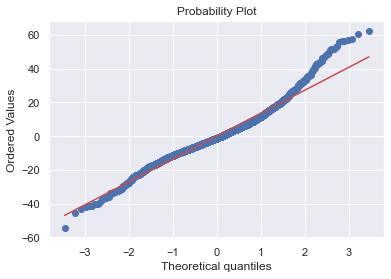

<IPython.core.display.Javascript object>

In [106]:
import pylab
import scipy.stats as stats

stats.probplot(df_pred["Residuals"], dist="norm", plot=pylab)
plt.show()

- The residuals more or less follow a straight line except for the tails.
- Let's check the results of the Shapiro-Wilk test.

In [107]:
stats.shapiro(df_pred["Residuals"])

ShapiroResult(statistic=0.9673511385917664, pvalue=2.1992274523422082e-23)

<IPython.core.display.Javascript object>

- Since p-value < 0.05, the residuals are not normal as per the Shapiro-Wilk test.
- Strictly speaking, the residuals are not normal.
- However, as an approximation, we can accept this distribution as close to being normal.
- **So, the assumption is satisfied.**

### TEST FOR HOMOSCEDASTICITY

* **Homoscedascity**: If the variance of the residuals is symmetrically distributed across the regression line, then the data is said to be homoscedastic.

* **Heteroscedascity**: If the variance is unequal for the residuals across the regression line, then the data is said to be heteroscedastic.

**Why the test?** 

* The presence of non-constant variance in the error terms results in heteroscedasticity. Generally, non-constant variance arises in presence of outliers.

**How to check for homoscedasticity?**

* The residual vs fitted values plot can be looked at to check for homoscedasticity. In the case of heteroscedasticity, the residuals can form an arrow shape or any other non-symmetrical shape.
* The goldfeldquandt test can also be used. If we get a p-value > 0.05 we can say that the residuals are homoscedastic. Otherwise, they are heteroscedastic.
    - Null hypothesis: Residuals are homoscedastic
    - Alternate hypothesis: Residuals have heteroscedasticity

**How to fix if this assumption is not followed?**

* Heteroscedasticity can be fixed by adding other important features or making transformations.

In [108]:
import statsmodels.stats.api as sms
from statsmodels.compat import lzip

name = ["F statistic", "p-value"]
test = sms.het_goldfeldquandt(df_pred["Residuals"], x_train1)
lzip(name, test)

[('F statistic', 0.9700713984628896), ('p-value', 0.7007275154936365)]

<IPython.core.display.Javascript object>

**Since p-value > 0.05, we can say that the residuals are homoscedastic. So, this assumption is satisfied.**

## Final Model Summary

**Now that we have checked all the assumptions of linear regression and they are satisfied, we can move towards the prediction part.**

In [109]:
# predictions on the test set
pred = olsmod1.predict(x1_test1)

df_pred_test = pd.DataFrame({"Actual": y1_test, "Predicted": pred})
df_pred_test.sample(10, random_state=1)

,Actual,Predicted
255,194.45,171.597011
1398,170.24,149.941802
2253,164.76,206.833267
579,39.09,42.456141
3123,45.08,36.346742
1959,51.05,55.576687
3111,40.07,33.269404
1456,54.75,51.011035
3332,95.06,107.861554
855,44.03,46.893550


<IPython.core.display.Javascript object>

- We can observe here that our model has returned pretty good prediction results, and the actual and predicted values are comparable.

- We can also visualize comparison result as a bar graph.

**Note**: As the number of records is large, for representation purpose, we are taking a sample of 25 records only.

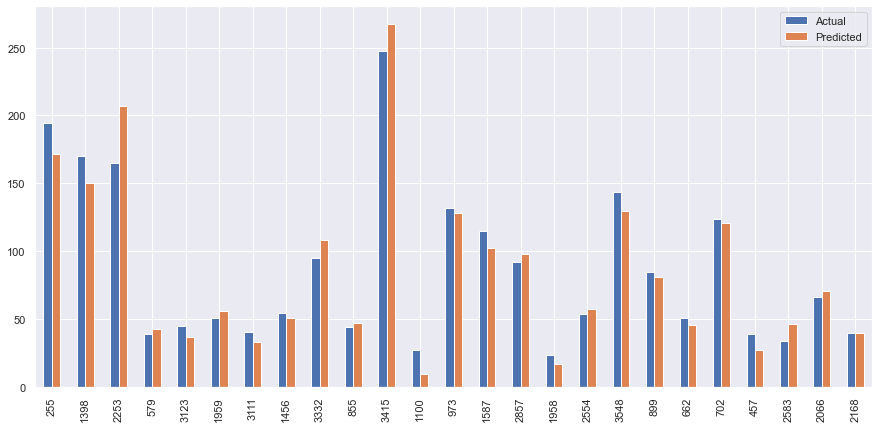

<IPython.core.display.Javascript object>

In [110]:
dff1 = df_pred_test.sample(25, random_state=1)
dff1.plot(kind="bar", figsize=(15, 7))
plt.show()

In [111]:
olsmodel_final = sm.OLS(y1_train, x1_train1).fit()
print(olsmodel_final.summary())

                            OLS Regression Results                            
Dep. Variable:             used_price   R-squared:                       0.956
Model:                            OLS   Adj. R-squared:                  0.956
Method:                 Least Squares   F-statistic:                     4175.
Date:                Wed, 29 Sep 2021   Prob (F-statistic):               0.00
Time:                        13:34:57   Log-Likelihood:                -10112.
No. Observations:                2499   AIC:                         2.025e+04
Df Residuals:                    2485   BIC:                         2.033e+04
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    60.82

<IPython.core.display.Javascript object>

## Actionable Insights and Recommendations

- 

Negative values of the coefficient show that the price of a used phone decreases with the increase of corresponding attribute value.This includes main_camera_mp,days_used,brand_name_Infinix,brand_name_OnePlus and os_Others

Positive values of the coefficient show that the price of a used phone increases with the increase of corresponding attribute value.This includes screen_size,os_iOS,int_memory,new_price

p-value of a variable indicates if the variable is significant or not. If we consider the significance level to be 0.05 (5%), then any variable with a p-value less than 0.05 would be considered significant.